<a href="https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/JoaoLages/diffusers-interpret/blob/main/notebooks/stable_diffusion_example_colab.ipynb"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Stable Diffusion 🎨 

This notebook shows an example of how to run `diffusers_interpret.StableDiffusionPipelineExplainer` to explain `diffusers.StableDiffusionPipeline`.

Before going through it, it is recommended to have a look at [🤗 HuggingFace's notebook](https://colab.research.google.com/github/huggingface/notebooks/blob/main/diffusers/stable_diffusion.ipynb#scrollTo=-xMJ6LaET6dT).

In [1]:
!nvidia-smi -L # enable GPU on Colab
!pip install -U diffusers-interpret

### 0 - Login in HuggingFace's Hub

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()

from huggingface_hub import notebook_login
notebook_login()

### 1 - Initialize StableDiffusionPipeline normally

In [3]:
# make sure you're logged in by running the previous cell or `huggingface-cli login`
import torch
from diffusers import StableDiffusionPipeline
from contextlib import nullcontext

device = 'cuda' if torch.cuda.is_available() else 'cpu'

pipe = StableDiffusionPipeline.from_pretrained(
    "CompVis/stable-diffusion-v1-4", 
    use_auth_token=True,
    
    # FP16 is not working for 'cpu'
    revision='fp16' if device != 'cpu' else None,
    torch_dtype=torch.float16 if device != 'cpu' else None
).to(device)
pipe.enable_attention_slicing() # comment this line if you wish to deactivate this option

{'trained_betas'} was not found in config. Values will be initialized to default values.


### 2 - Pass `StableDiffusionPipeline` to `StableDiffusionPipelineExplainer`

In [4]:
from diffusers_interpret import StableDiffusionPipelineExplainer

explainer = StableDiffusionPipelineExplainer(
    pipe,
    
    # We pass `True` in here to be able to have a higher `n_last_diffusion_steps_to_consider_for_attributions` in the cell below
    gradient_checkpointing=True 
)

### 3 - Generate an image with the `StableDiffusionPipelineExplainer` object

Note that the `explainer()` method accepts all the arguments that `pipe()` accepts. 

We also pass a `generator` argument so that we get a deterministic output.

In [5]:
prompt = "A cute corgi with the Eiffel Tower in the background"

generator = torch.Generator(device).manual_seed(2023)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt, 
        num_inference_steps=50, 
        generator=generator,
        height=448,
        width=448,
        
        # for this model, the GPU VRAM usage will raise drastically if we increase this argument. feel free to experiment with it
        # if you are not interested in checking the token attributions, you can pass 0 in here
        n_last_diffusion_steps_to_consider_for_attributions=5
    )

  0%|          | 0/51 [00:00<?, ?it/s]

Calculating token attributions... Done!


#### 3.1 - Final generated image

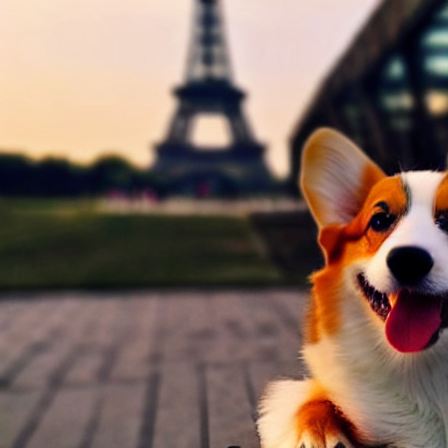

In [6]:
# Final image
output.image

#### 3.2 -  Check all the generated images during the diffusion process

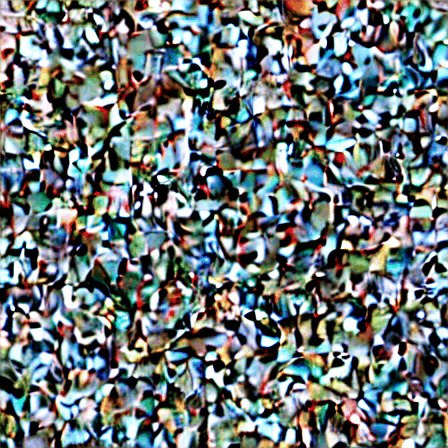

In [7]:
# Google Colab does not render the IFrame from the code below, only works locally on your Jupyter Notebook.
#output.all_images_during_generation.show(width="100%", height="400px")

# but we can see the GIF!
output.all_images_during_generation.gif(file_name="diffusion_process.gif", duration=400)

You can also check the images individually:

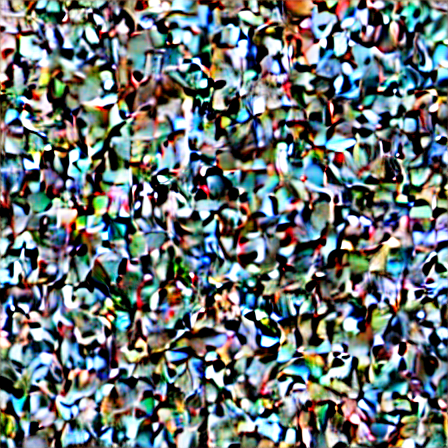

In [8]:
# Image at first generation 
output.all_images_during_generation[0]

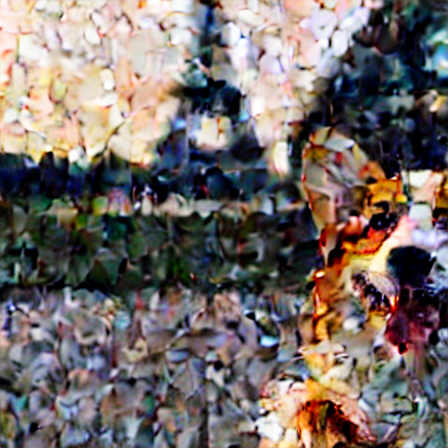

In [9]:
# Image at 33rd generation 
output.all_images_during_generation[33]

#### 3.3 - Normalized and unnormalized token attributions 

We are now able to see what were the importances of each token in the input text to generate when generating the image.

The token `corgi` was the most important feature according to our explainability method.

In [10]:
# (token, attribution)
output.token_attributions

[('a', 8.164731),
 ('cute', 13.339774),
 ('corgi', 22.772966),
 ('with', 9.434287),
 ('the', 3.559407),
 ('eiffel', 6.21658),
 ('tower', 8.858046),
 ('in', 4.7401295),
 ('the', 1.4522047),
 ('background', 5.802524)]

In [11]:
# (token, attribution_percentage)
output.normalized_token_attributions

[('a', 9.681),
 ('cute', 15.817),
 ('corgi', 27.001),
 ('with', 11.186),
 ('the', 4.22),
 ('eiffel', 7.371),
 ('tower', 10.503),
 ('in', 5.62),
 ('the', 1.722),
 ('background', 6.88)]

### 4 - Get explanations for a specific part of the image

`diffusers-interpret` also computes the tokens importances for generating a particular part of the output image.

In the current implementation, we only need to re-run the `explainer` and pass it the `explanation_2d_bounding_box` argument with the bounding box we are interested in seeing.

In [12]:
prompt = "A cute corgi with the Eiffel Tower in the background"

generator = torch.Generator(device).manual_seed(2023)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt, 
        num_inference_steps=50, 
        generator=generator,
        height=448,
        width=448,
        
        # for this model, the GPU VRAM usage will raise drastically if we increase this argument. feel free to experiment with it
        # if you are not interested in checking the token attributions, you can pass 0 in here
        n_last_diffusion_steps_to_consider_for_attributions=5,
        
        explanation_2d_bounding_box=((305, 180), (448, 448)), # (upper left corner, bottom right corner)
    )


  0%|          | 0/51 [00:00<?, ?it/s]

Calculating token attributions... Done!


#### 4.1 - Check generated image

A red bounding box is now visible in the picture, to indicate the area that `explainer` is looking at when calculating the token attributions.

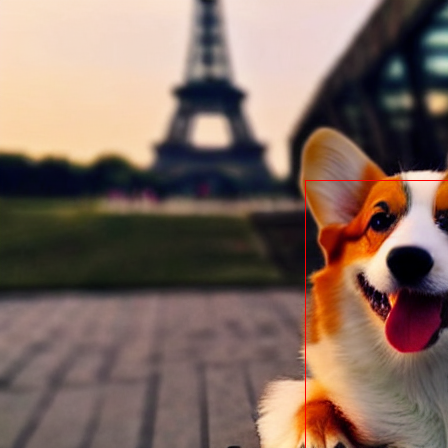

In [13]:
output.image

#### 4.2 - Check token attributions for bounding box

In [14]:
# (token, attribution_percentage)
output.normalized_token_attributions

[('a', 10.78),
 ('cute', 4.143),
 ('corgi', 41.535),
 ('with', 10.575),
 ('the', 4.926),
 ('eiffel', 5.032),
 ('tower', 8.141),
 ('in', 6.072),
 ('the', 1.426),
 ('background', 7.369)]

### 5 - Same generation, but with a different `explanation_2d_bounding_box`

In [15]:
prompt = "A cute corgi with the Eiffel Tower in the background"

generator = torch.Generator(device).manual_seed(2023)
with torch.autocast('cuda') if device == 'cuda' else nullcontext():
    output = explainer(
        prompt, 
        num_inference_steps=50, 
        generator=generator,
        height=448,
        width=448,
        
        # for this model, the GPU VRAM usage will raise drastically if we increase this argument. feel free to experiment with it
        # if you are not interested in checking the token attributions, you can pass 0 in here
        n_last_diffusion_steps_to_consider_for_attributions=5,
        
        explanation_2d_bounding_box=((140, 0), (270, 190)), # (upper left corner, bottom right corner)
    )

  0%|          | 0/51 [00:00<?, ?it/s]

Calculating token attributions... Done!


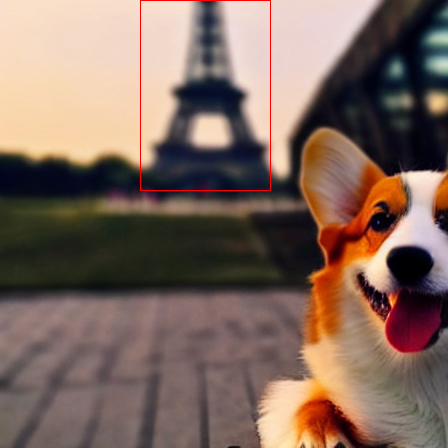

In [16]:
output.image

In [17]:
# (token, attribution_percentage)
output.normalized_token_attributions

[('a', 8.065),
 ('cute', 9.102),
 ('corgi', 19.036),
 ('with', 8.723),
 ('the', 3.563),
 ('eiffel', 17.941),
 ('tower', 21.971),
 ('in', 4.326),
 ('the', 1.169),
 ('background', 6.104)]